In [1]:
import SimDAT2D.SimDAT2D as sim
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import IsoDAT2D.IsoDAT2D as iso
from PIL import Image
import pyFAI, fabio
from pyFAI.gui import jupyter
import pyFAI
import os
import matplotlib.pyplot as plt
import masking

In [2]:
import numpy as np

def generate_gaussian_rings(
    shape=(2048, 2048),
    center=None,
    rings=[(200, 5), (500, 20), (800, 50)]
):
    """
    Create an image with Gaussian rings.

    Parameters:
    - shape (tuple): Size of the image, default is (2048, 2048).
    - center (tuple): (x, y) center of the rings. Default is image center.
    - rings (list): List of tuples (radius, sigma) for each ring.
                    Smaller sigma = sharper ring (Bragg-like),
                    Larger sigma = more diffuse ring.

    Returns:
    - image (np.ndarray): 2D array with Gaussian ring intensities.
    """
    ny, nx = shape
    if center is None:
        center = (nx // 2, ny // 2)
    cx, cy = center

    # Create grid
    y, x = np.indices(shape)
    r = np.sqrt((x - cx) ** 2 + (y - cy) ** 2)

    # Initialize image
    image = np.zeros(shape, dtype=np.float32)

    # Add rings
    for radius, sigma in rings:
        gaussian_ring = np.exp(-((r - radius) ** 2) / (2 * sigma ** 2))
        image += gaussian_ring

    return image


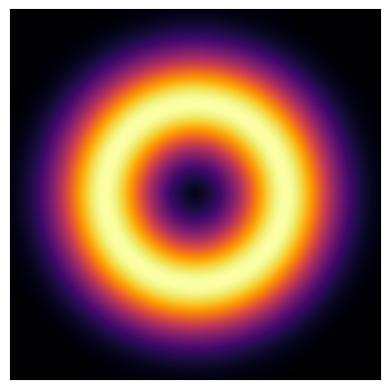

In [7]:
# Define some example rings: (radius, sigma)
rings = [(500, 200)]

# Generate image
img = generate_gaussian_rings(rings=rings, center=(1024, 1024))

# Display
plt.imshow(img, cmap='inferno')
plt.yticks([])
plt.xticks([])
plt.show()


Select calibrant:
1. AgBh
2. Al
3. alpha_Al2O3
4. Au
5. C14H30O
6. CeO2
7. Cr2O3
8. cristobaltite
9. CrOx
10. CuO
11. hydrocerussite
12. LaB6
13. LaB6_SRM660a
14. LaB6_SRM660b
15. LaB6_SRM660c
16. mock
17. NaCl
18. Ni
19. PBBA
20. Pt
21. quartz
22. Si
23. Si_SRM640
24. Si_SRM640a
25. Si_SRM640b
26. Si_SRM640c
27. Si_SRM640d
28. Si_SRM640e
29. TiO2
30. ZnO
Al


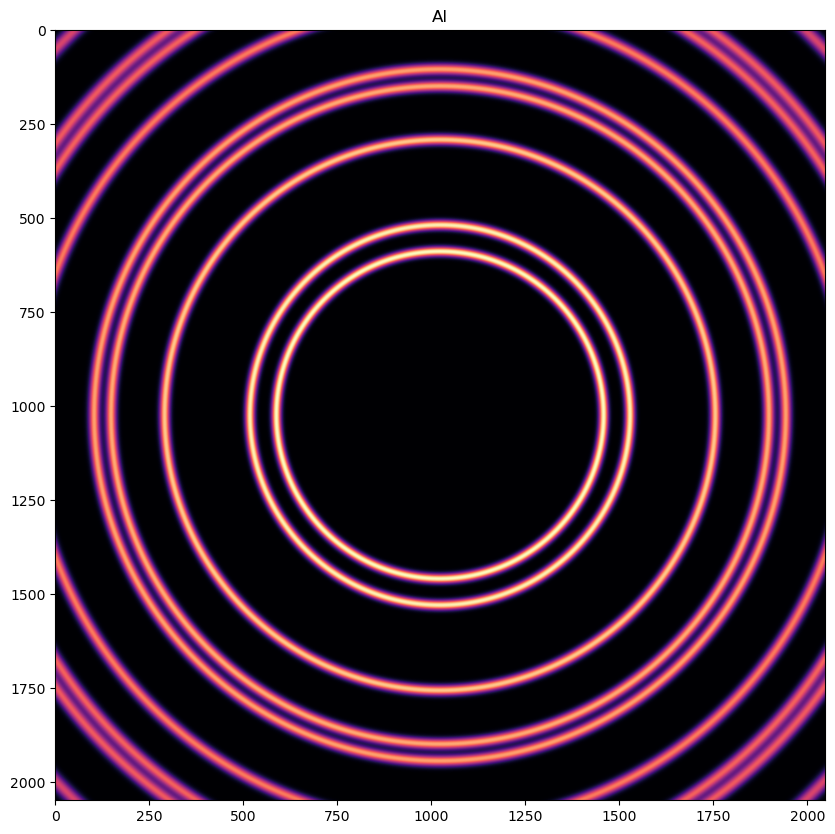

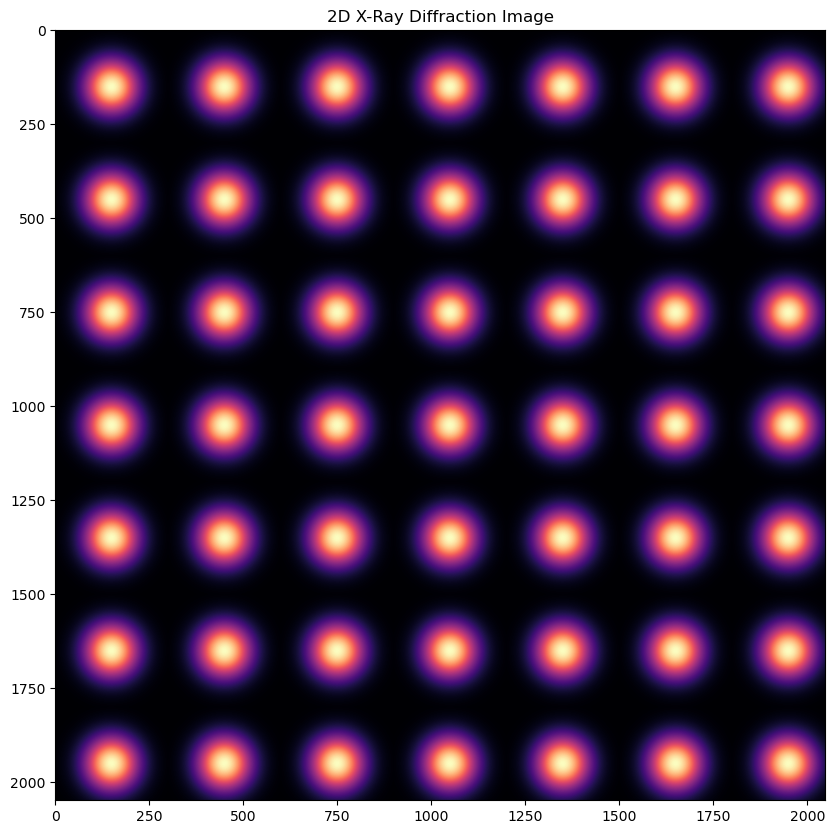

In [8]:
#For ring creation
isotropic_signal = sim.create_isotropic(.4, .5e-10, cmap = 'magma')
#For spot creation
anisotropic_signal = sim.create_anisotropic(25, 50, 300, 300, cmap = 'magma')
#for diffuse ring creation
diffuse_signal = generate_gaussian_rings(rings=rings, center=(1024, 1024))

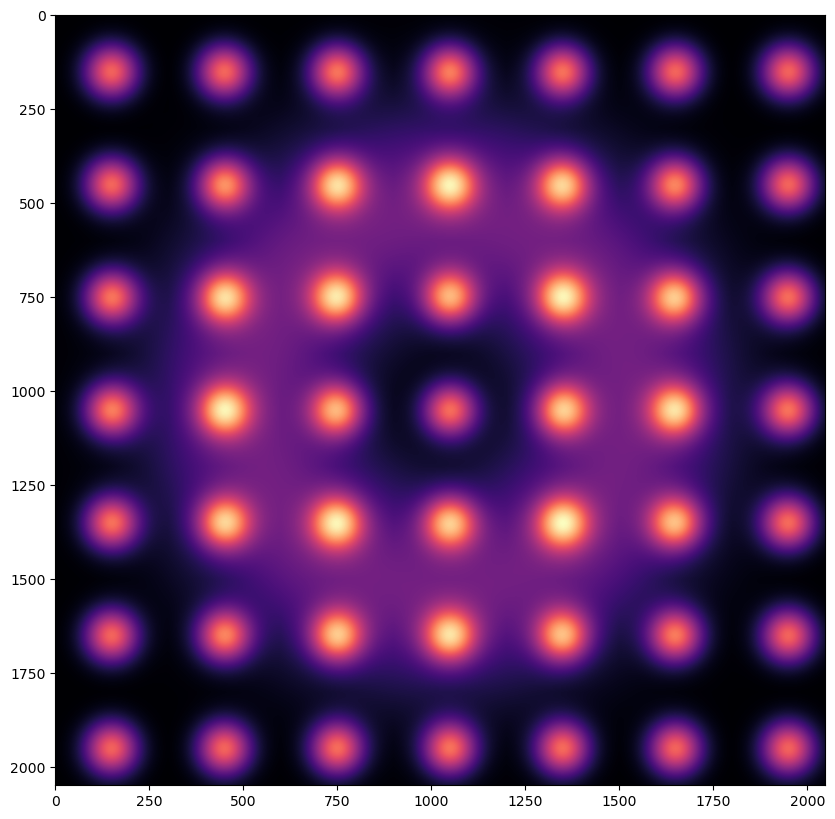

In [9]:
#Making first endpoint 

thin_film_one = (diffuse_signal + anisotropic_signal*2)/3
plt.figure(figsize=(10, 10))
plt.imshow(thin_film_one, cmap='magma')

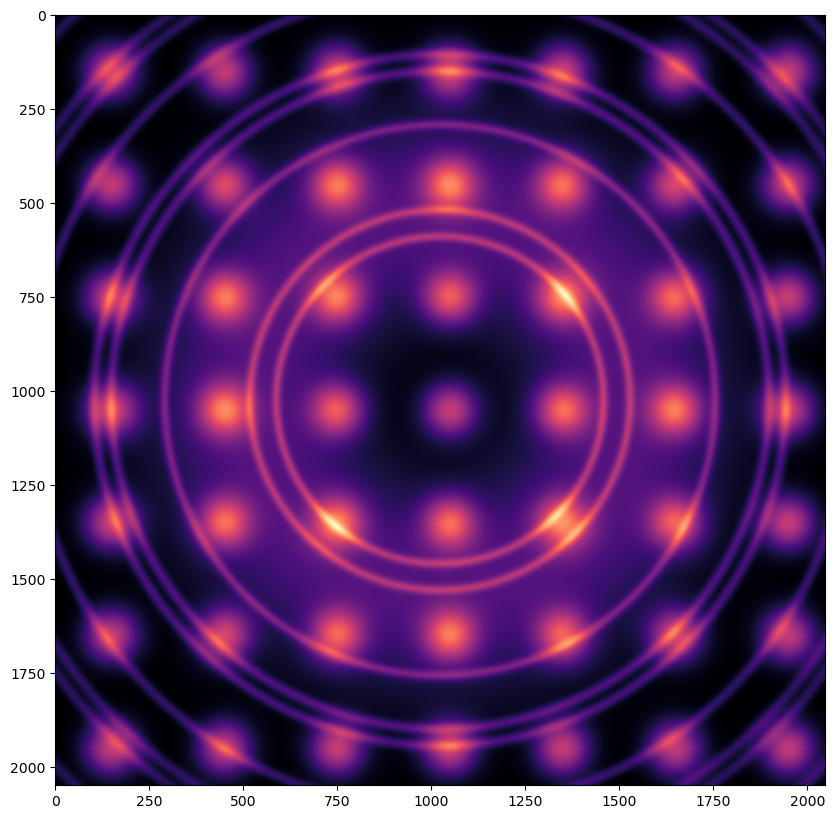

In [10]:
#Making second endpoint 

thin_film_two = (diffuse_signal + isotropic_signal + anisotropic_signal*2)/4
plt.figure(figsize=(10, 10))
plt.imshow(thin_film_two, cmap='magma')

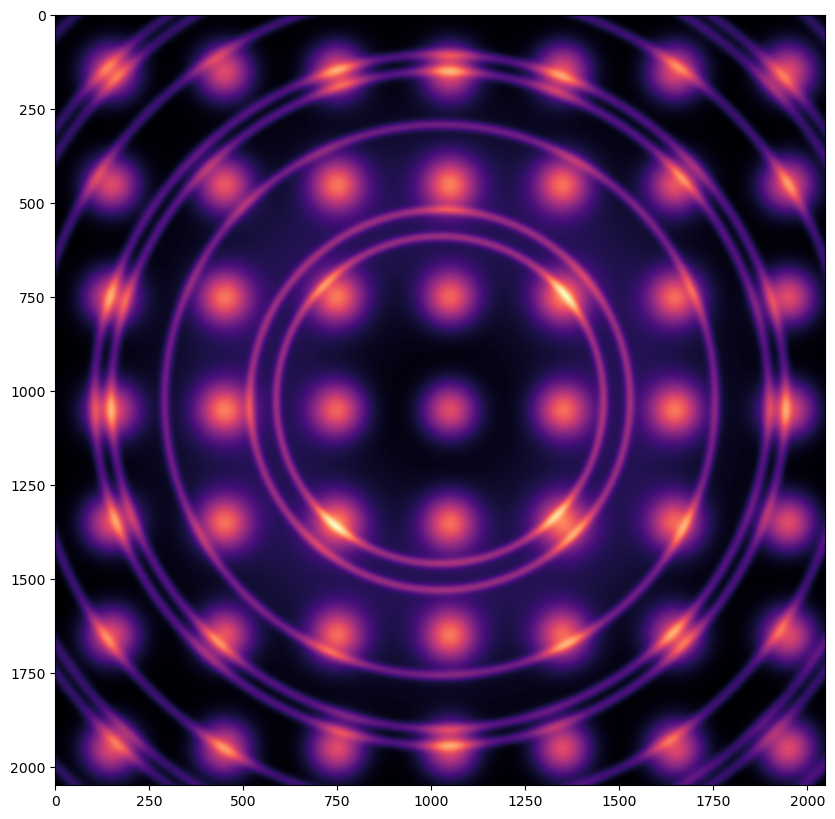

In [11]:
#Making third endpoint 

thin_film_three = (diffuse_signal/2 + isotropic_signal + anisotropic_signal*2)/4
plt.figure(figsize=(10, 10))
plt.imshow(thin_film_three, cmap='magma')

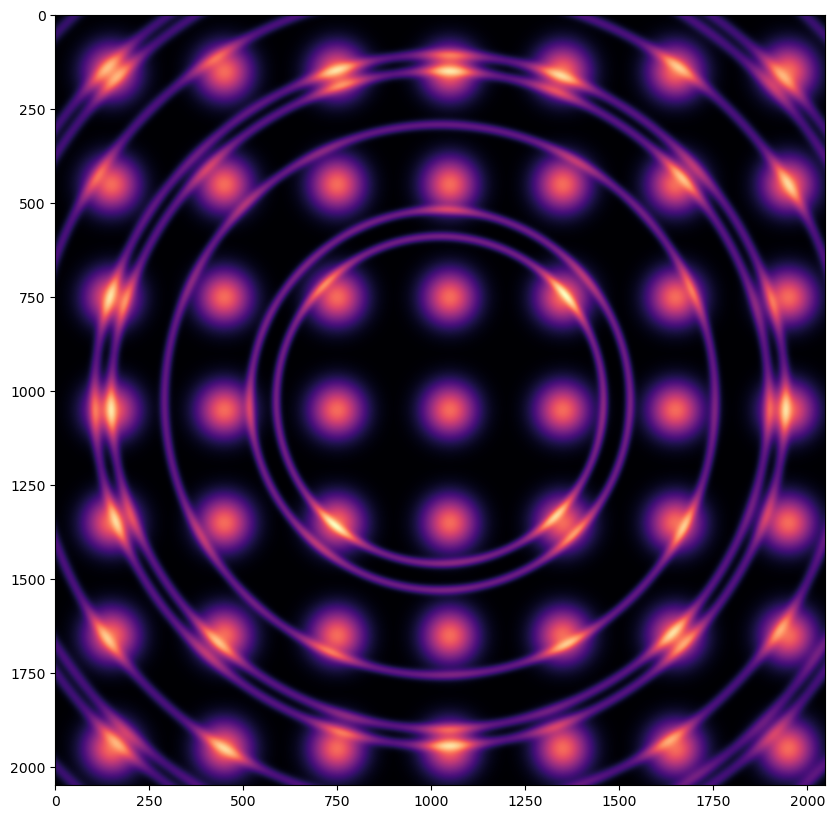

In [12]:
#Making fourth endpoint 

thin_film_four = (isotropic_signal + anisotropic_signal*2)/3
plt.figure(figsize=(10, 10))
plt.imshow(thin_film_four, cmap='magma')

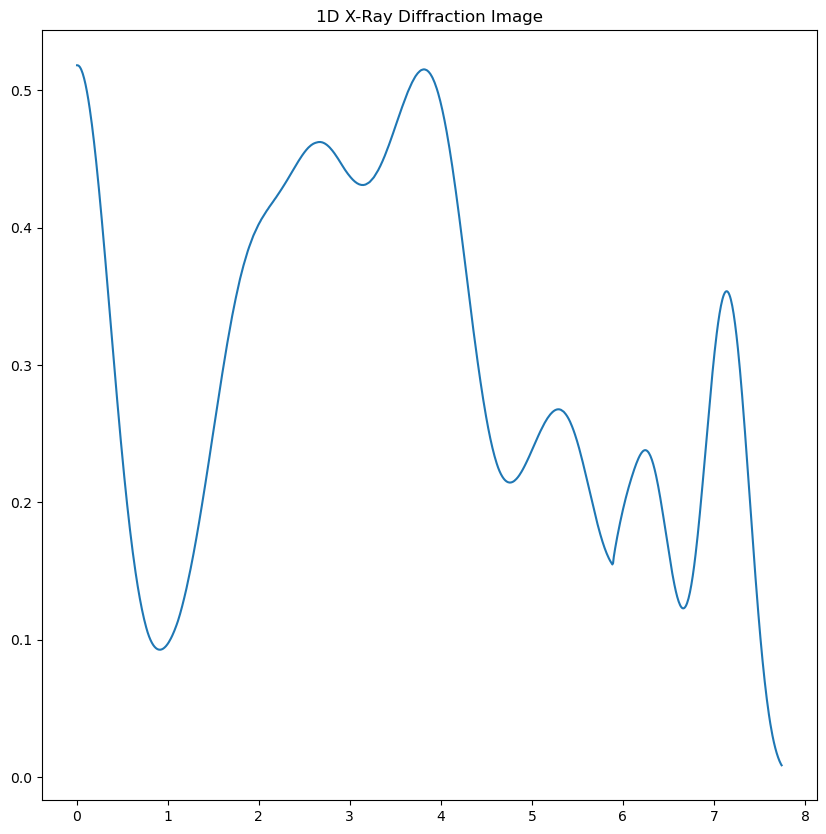

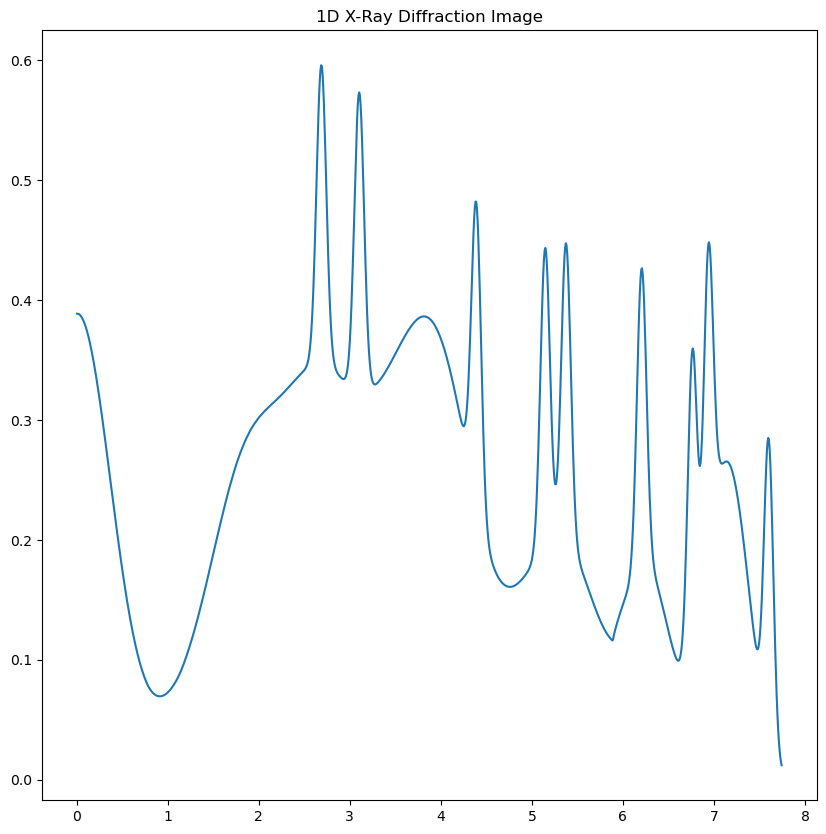

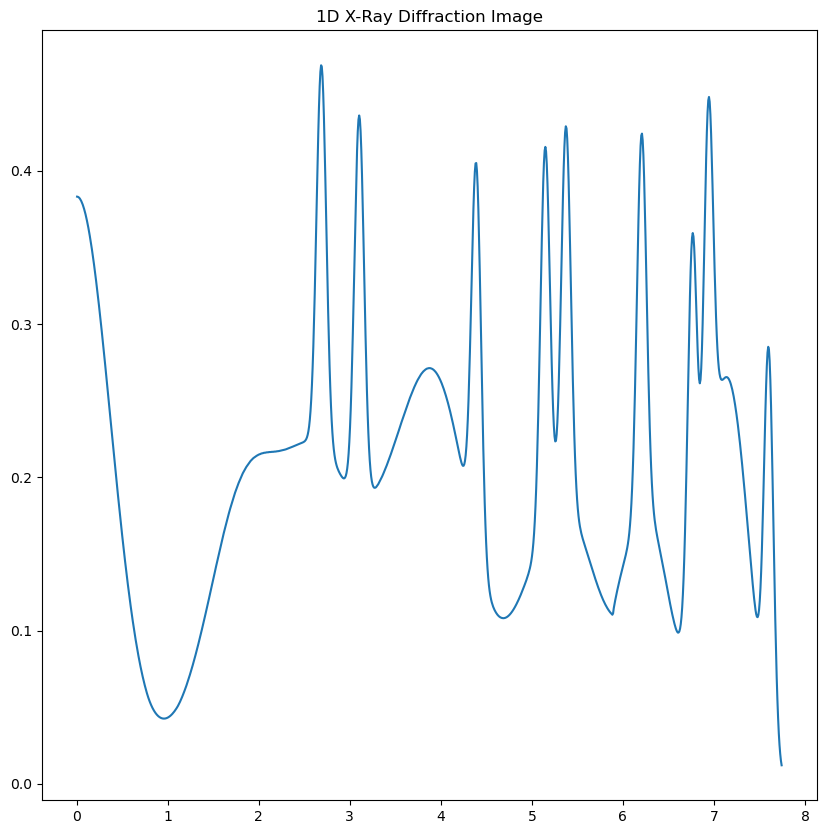

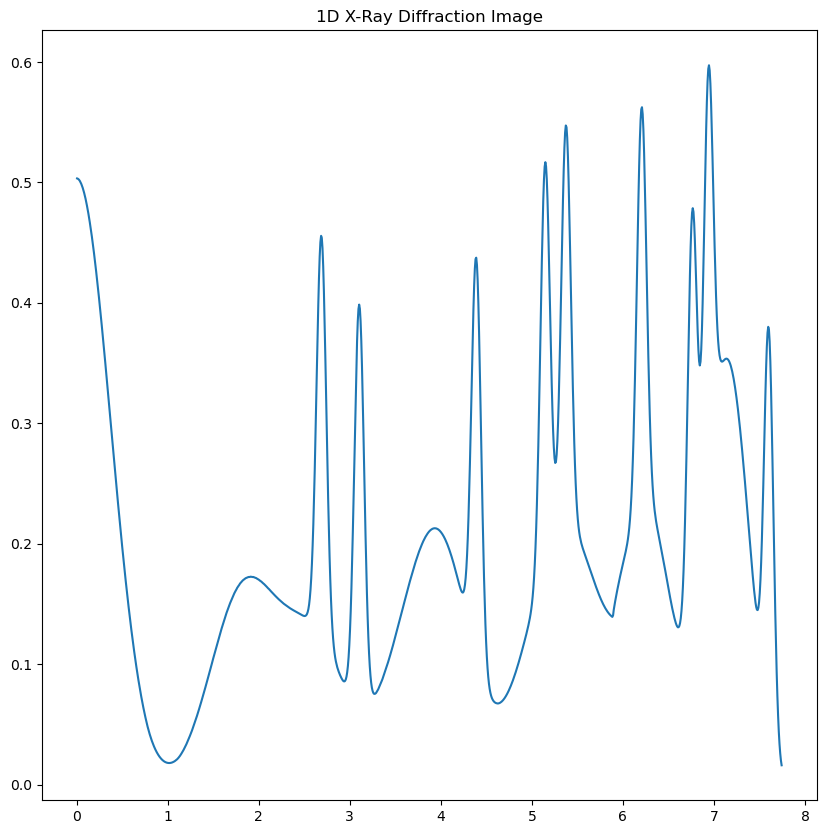

In [13]:
q, int_one = sim.integrate_image(thin_film_one, 0.4, 0.5e-10, resolution = 1000, show = True)
q, int_two = sim.integrate_image(thin_film_two, 0.4, 0.5e-10, resolution = 1000, show = True)
q, int_three = sim.integrate_image(thin_film_three, 0.4, 0.5e-10, resolution = 1000, show = True)
q, int_four = sim.integrate_image(thin_film_four, 0.4, 0.5e-10, resolution = 1000, show = True)

In [18]:
def fill_with_circle(image, radius=None, center=None):
    """
    Fill NaN values with the mean of neighboring non-NaN pixels, but only within
    a circular region defined by radius and center
    Parameters:
    image: 2D numpy array
    radius: radius of circle (default: min(height,width)/2)
    center: (y,x) coordinates of circle center (default: image center)
    """
    # Create a copy of the image
    filled_image = np.copy(image)
    # Set defaults if not provided
    if center is None:
        center = (image.shape[0]//2, image.shape[1]//2)  # (y, x)
    if radius is None:
        radius = min(image.shape[0], image.shape[1])//2
    # Create a circular mask
    y, x = np.ogrid[:image.shape[0], :image.shape[1]]
    dist_from_center = np.sqrt((y - center[0])**2 + (x - center[1])**2)
    circle_mask = dist_from_center <= radius
    # Set all pixels outside circle to NaN
    filled_image[~circle_mask] = np.nan
    return filled_image

def fill_nan_with_neighbor_mean_circle(image, radius=None, center=None):
    """
    Fill NaN values with the mean of neighboring non-NaN pixels, but only within
    a circular region defined by radius and center
    Parameters:
    image: 2D numpy array
    radius: radius of circle (default: min(height,width)/2)
    center: (y,x) coordinates of circle center (default: image center)
    """
    # Create a copy of the image
    filled_image = np.copy(image)
    # Set defaults if not provided
    if center is None:
        center = (image.shape[0]//2, image.shape[1]//2)  # (y, x)
    if radius is None:
        radius = min(image.shape[0], image.shape[1])//2
    # Create a circular mask
    y, x = np.ogrid[:image.shape[0], :image.shape[1]]
    dist_from_center = np.sqrt((y - center[0])**2 + (x - center[1])**2)
    circle_mask = dist_from_center <= radius
    # Find NaN pixels
    nan_y, nan_x = np.where(np.isnan(filled_image))
    # Loop through each NaN pixel
    for y, x in zip(nan_y, nan_x):
        # Check if this pixel is within the circle
        if circle_mask[y, x]:
            # Define a window around the NaN pixel (5x5 window)
            y_start = max(0, y - 2)
            y_end = min(image.shape[0], y + 3)
            x_start = max(0, x - 2)
            x_end = min(image.shape[1], x + 3)
            # Extract the window
            window = filled_image[y_start:y_end, x_start:x_end]
            # Calculate mean of non-NaN values in the window
            mean_value = np.nanmean(window)
            # Replace NaN with the calculated mean
            filled_image[y, x] = mean_value
    # Set all pixels outside circle to NaN
    filled_image[~circle_mask] = np.nan
    return filled_image

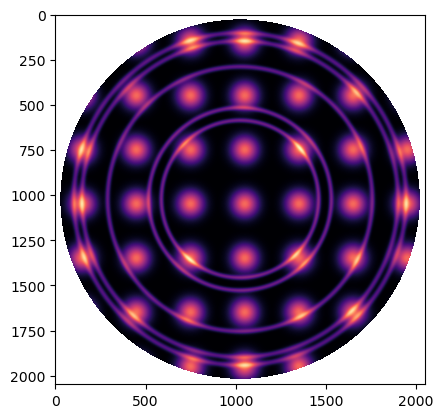

In [22]:
bragg_circle = fill_with_circle(thin_film_four, radius = 1000, center = (1024, 1024))
plt.imshow(bragg_circle, cmap = 'magma')
plt.show()


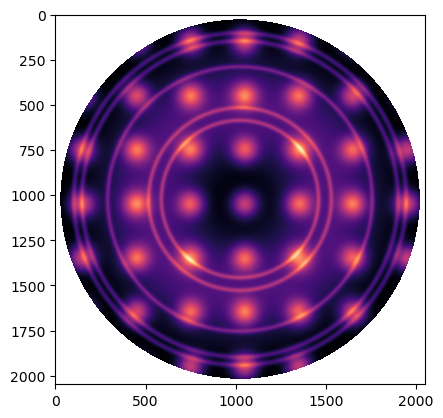

In [105]:
int_circle = fill_with_circle(thin_film_two, radius = 1000, center = (1024, 1024))
plt.imshow(int_circle, cmap = 'magma')
plt.show()

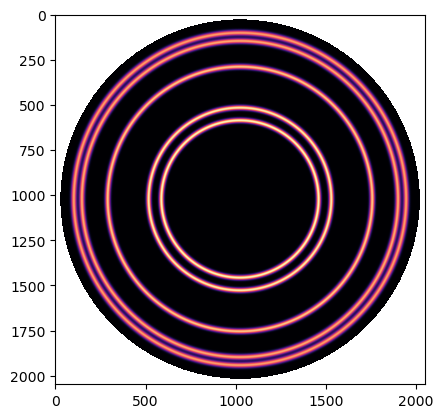

In [108]:
only_bragg_circle = fill_with_circle((isotropic_signal), radius = 1000, center = (1024, 1024))
plt.imshow(only_bragg_circle, cmap = 'magma')
plt.show()

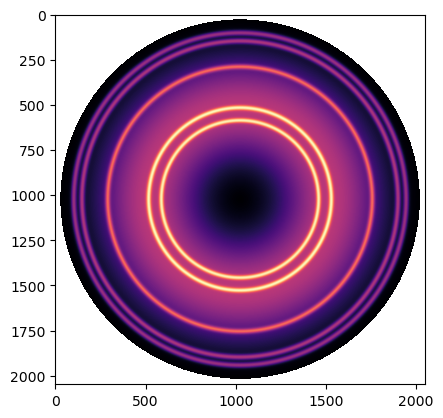

In [109]:
only_int_circle = fill_with_circle((isotropic_signal+diffuse_signal), radius = 1000, center = (1024, 1024))
plt.imshow(only_int_circle, cmap = 'magma')
plt.show()

In [25]:
#masking algoirthm to create masks for the data

def make_masks(array, slices, offset = 5, width=.5, gits = False):
    masks = []
    mask_2048 = np.zeros((2048, 2048), dtype=bool)
    mask_2048[1024:] = True
    for i in slices:
        masks.append(masking.generate_mask_slices(array, width, i, offset = offset))
        print('Mask with {} slices created'.format(i))
        if gits == True:
            gits_masks = []
            for i in range(len(masks)):
                masks_p = masks[i] + mask_2048
                gits_masks.append(masks_p)
                plt.imshow(masks_p)
    return gits_masks

[masked_array(
  data=[[-135.00017100451313, -134.97216689027152, -134.94413749056966,
         ..., -45.05619265132289, -45.02816084175853, -45.00015640746067],
        [-135.02817528583523, -135.0001711717571, -134.97214174542282,
         ..., -45.02818839694317, -45.00015656042945, -44.97215212598207],
        [-135.05620485260465, -135.02820076548636, -135.000171339316,
         ..., -45.00015880320792, -44.972126966543236,
         -44.94412255874272],
        ...,
        [135.0561923155709, 135.02818822843457, 135.00015880225814, ...,
         45.00017134026579, 44.97213950359518, 44.94413509577675],
        [135.0281606735792, 135.000156559494, 134.9721271331666, ...,
         45.028203009199196, 45.00017117269255, 44.972166738238265],
        [135.00015640652705, 134.97215229229232, 134.94412289261135, ...,
         45.05620724928089, 45.028175439737566, 45.00017100544677]],
  mask=[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, Fal

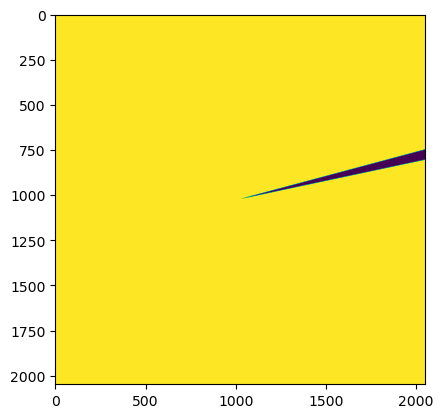

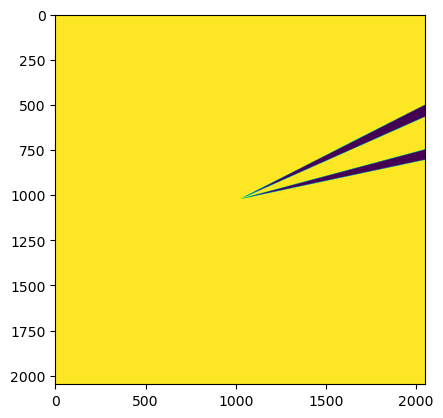

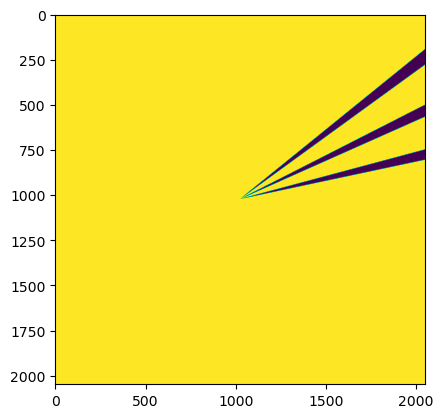

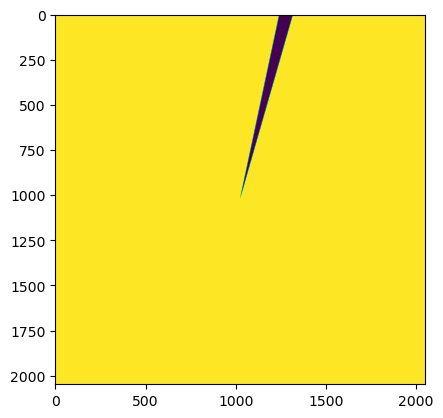

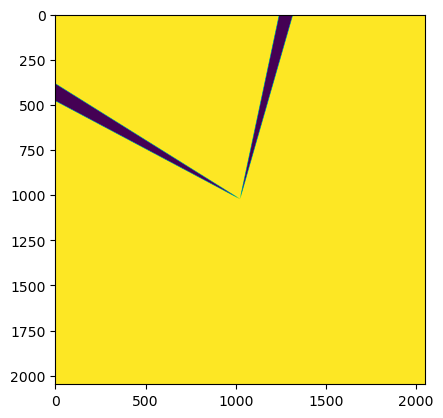

In [27]:
array, ai_pe = masking.make_chi_array(bragg_circle, .4, .5e-10)
masks = make_masks(array, [1,2,3], offset = 9, width = 3, gits = True)
masks_v2 = make_masks(array, [1,2], offset = 70, width = 4, gits = True)
mask_one = masks[0] 
mask_two = masks[1] 
mask_three = masks[2] 
mask_four = masks_v2[0] 
mask_five = masks_v2[1]

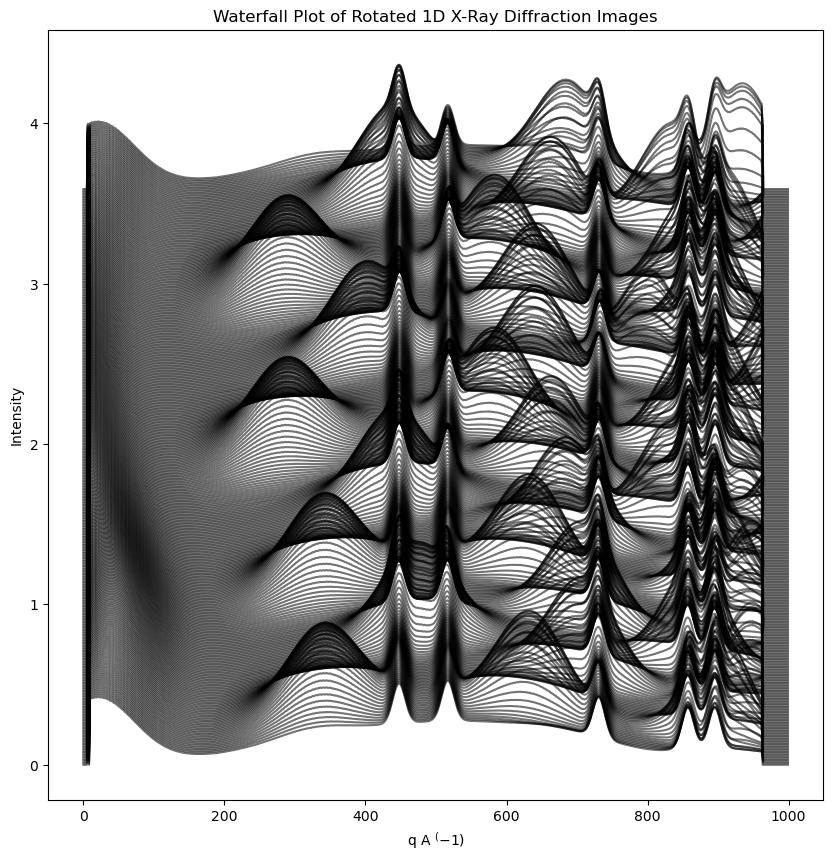

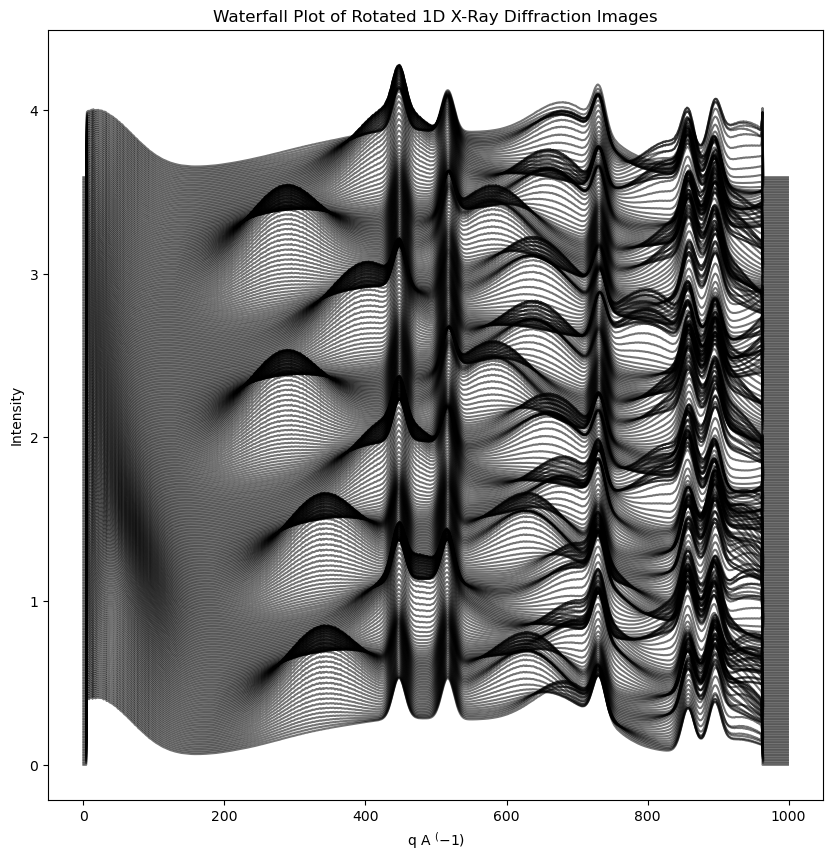

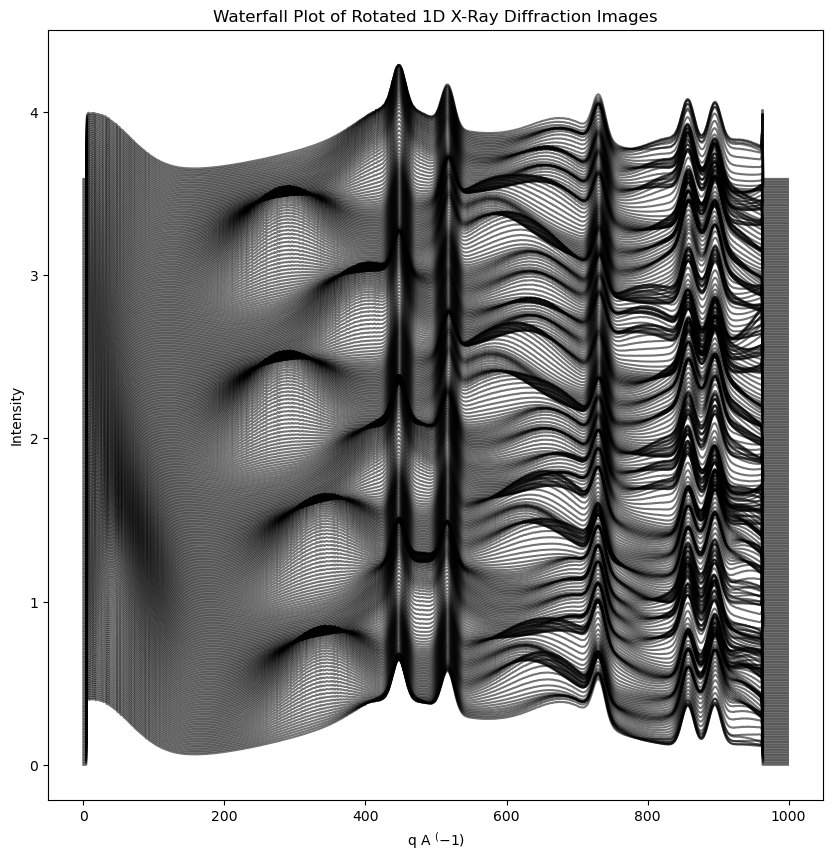

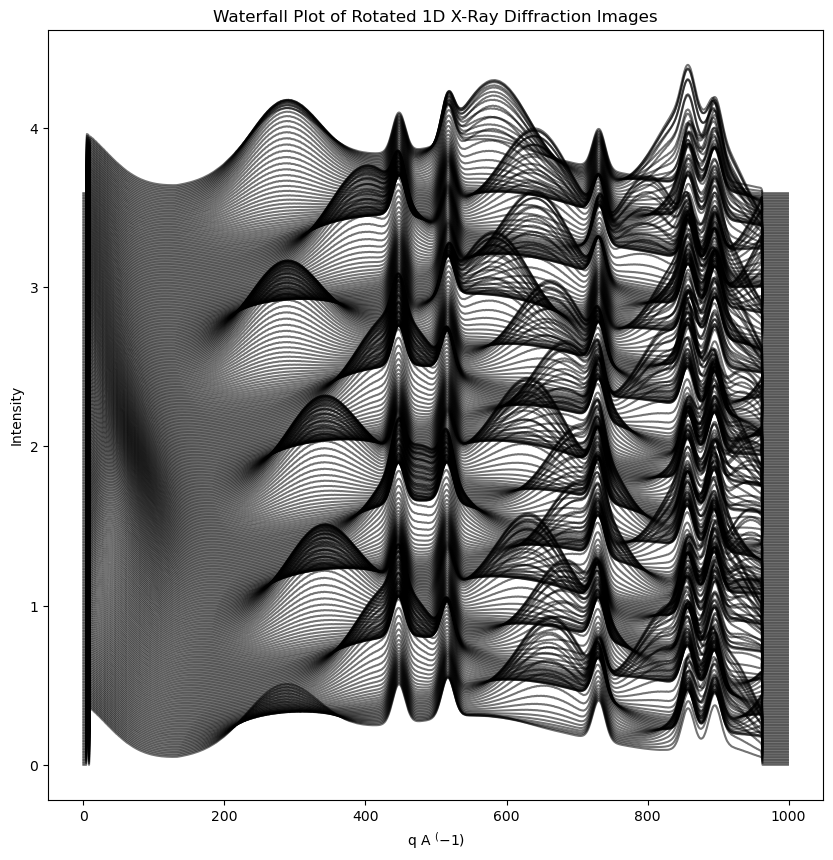

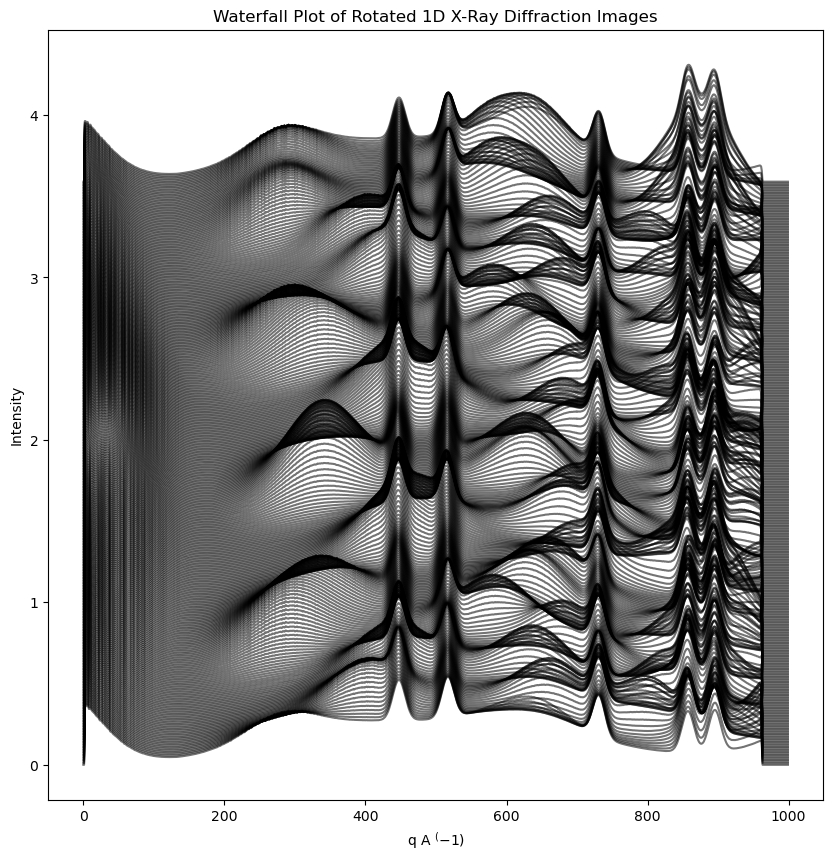

In [97]:
two_rotated_data_one = iso.rotate_integrate_image_gpu(int_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_one, radial_range = (0, 6))
two_rotated_data_two = iso.rotate_integrate_image_gpu(int_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_two, radial_range = (0, 6))
two_rotated_data_three = iso.rotate_integrate_image_gpu(int_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_three, radial_range = (0, 6))
two_rotated_data_four = iso.rotate_integrate_image_gpu(int_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_four, radial_range = (0, 6))
two_rotated_data_five = iso.rotate_integrate_image_gpu(int_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_five, radial_range = (0, 6))

In [98]:
column_mapping = {}
for i in range(361, 721):
    column_mapping[(i - 361)] = (i)
two_rotated_data_two.rename(columns=column_mapping, inplace=True) 
   
column_mapping = {}
for i in range(722, 1082):
    column_mapping[(i - 722)] = (i)
print(column_mapping)
two_rotated_data_three.rename(columns=column_mapping, inplace=True)

column_mapping = {}
for i in range(1083, 1443):
    column_mapping[(i - 1083)] = (i)
print(column_mapping)
two_rotated_data_four.rename(columns=column_mapping, inplace=True)  
  
column_mapping = {}
for i in range(1444, 1804):
    column_mapping[(i - 1444)] = (i)
two_rotated_data_five.rename(columns=column_mapping, inplace=True)

combining_two = pd.concat([two_rotated_data_one, two_rotated_data_two, two_rotated_data_three, two_rotated_data_four, two_rotated_data_five], axis = 1)
combined_rot_data_two = combining_two.clip(lower=0)
combined_rot_data_two = np.array(combined_rot_data_two) 

{0: 722, 1: 723, 2: 724, 3: 725, 4: 726, 5: 727, 6: 728, 7: 729, 8: 730, 9: 731, 10: 732, 11: 733, 12: 734, 13: 735, 14: 736, 15: 737, 16: 738, 17: 739, 18: 740, 19: 741, 20: 742, 21: 743, 22: 744, 23: 745, 24: 746, 25: 747, 26: 748, 27: 749, 28: 750, 29: 751, 30: 752, 31: 753, 32: 754, 33: 755, 34: 756, 35: 757, 36: 758, 37: 759, 38: 760, 39: 761, 40: 762, 41: 763, 42: 764, 43: 765, 44: 766, 45: 767, 46: 768, 47: 769, 48: 770, 49: 771, 50: 772, 51: 773, 52: 774, 53: 775, 54: 776, 55: 777, 56: 778, 57: 779, 58: 780, 59: 781, 60: 782, 61: 783, 62: 784, 63: 785, 64: 786, 65: 787, 66: 788, 67: 789, 68: 790, 69: 791, 70: 792, 71: 793, 72: 794, 73: 795, 74: 796, 75: 797, 76: 798, 77: 799, 78: 800, 79: 801, 80: 802, 81: 803, 82: 804, 83: 805, 84: 806, 85: 807, 86: 808, 87: 809, 88: 810, 89: 811, 90: 812, 91: 813, 92: 814, 93: 815, 94: 816, 95: 817, 96: 818, 97: 819, 98: 820, 99: 821, 100: 822, 101: 823, 102: 824, 103: 825, 104: 826, 105: 827, 106: 828, 107: 829, 108: 830, 109: 831, 110: 832,

Starting NMF algorithm with the following parameters:

Max components: 40
Max iterations: 1000
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvdar, solver: mu, tol: 1e-06
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed
Run with 10 components has been completed
Run with 11 components has been completed
Run with 12 components has been completed
Run with 13 components has been completed
Run with 14 components has been completed
Run with 15 components has been completed
Run with 16 components has been completed
Run with 17 components has been completed
Run with 18 components ha

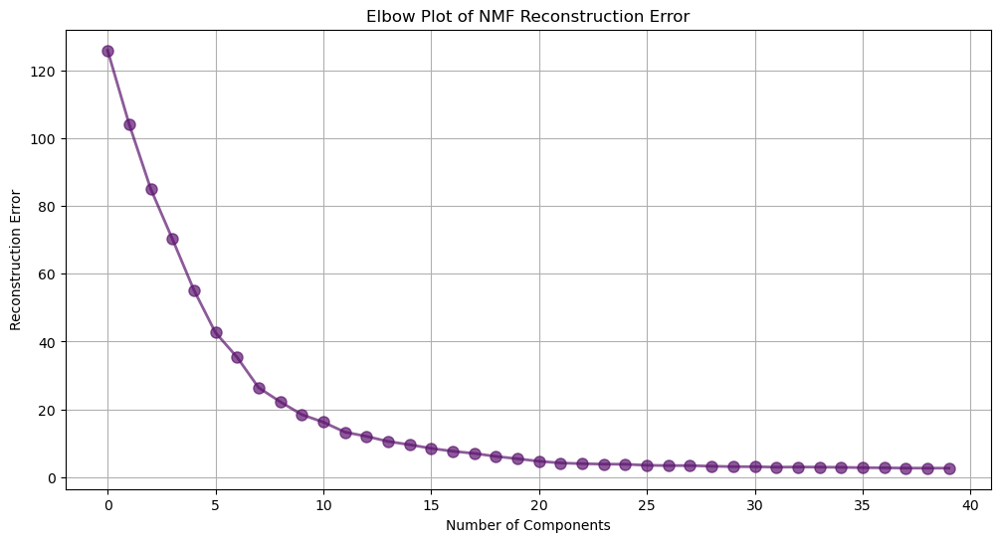

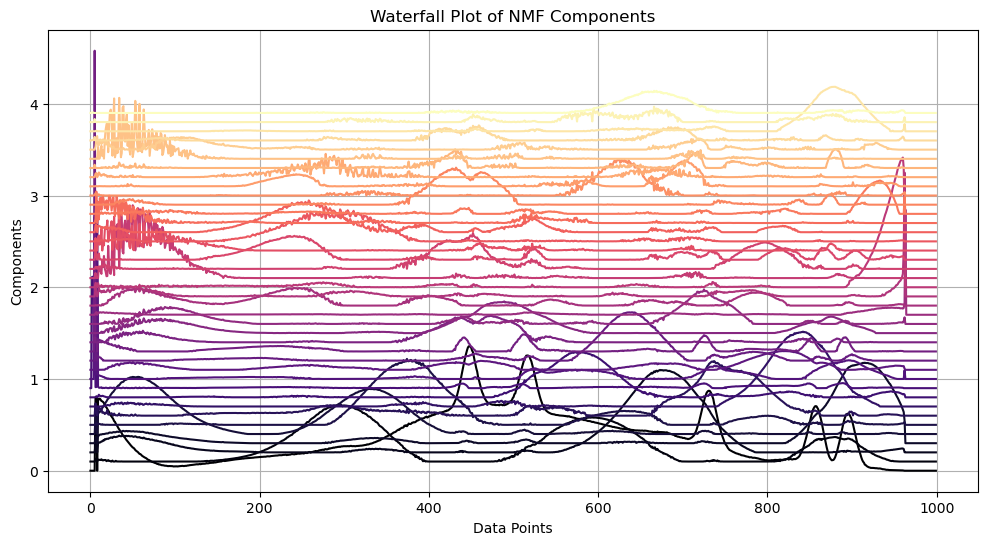

The best number of components is 40


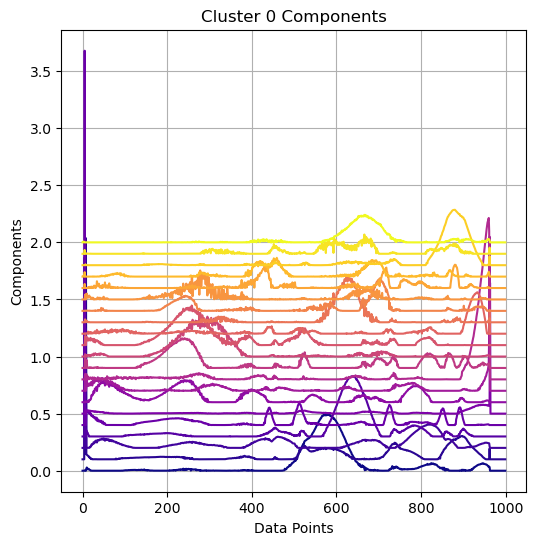

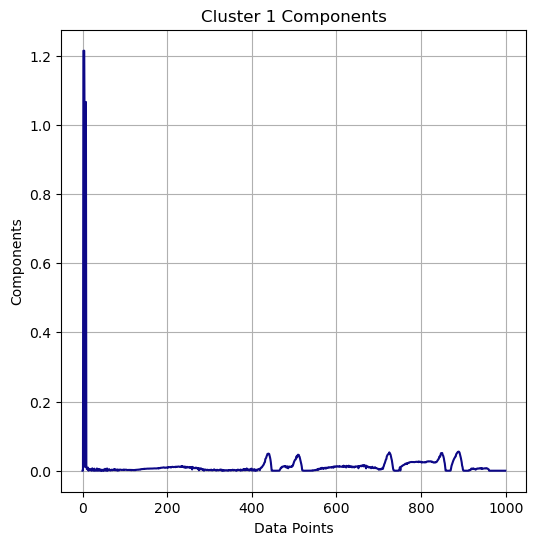

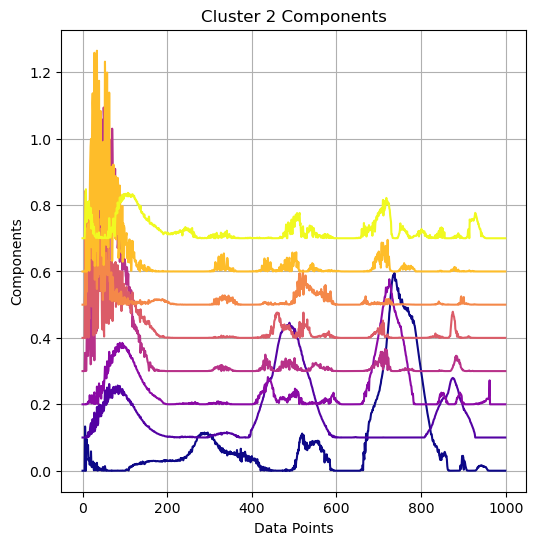

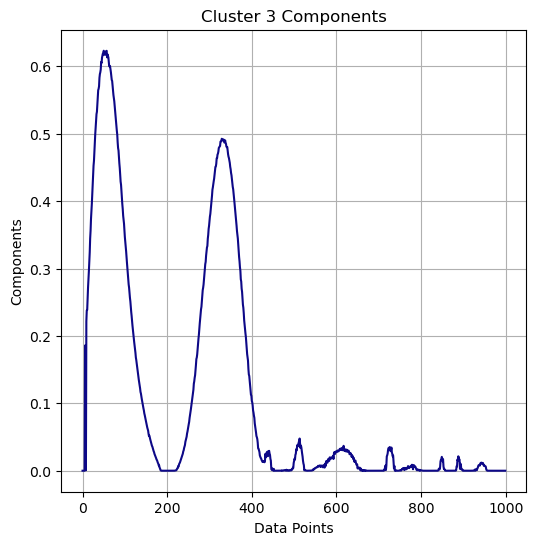

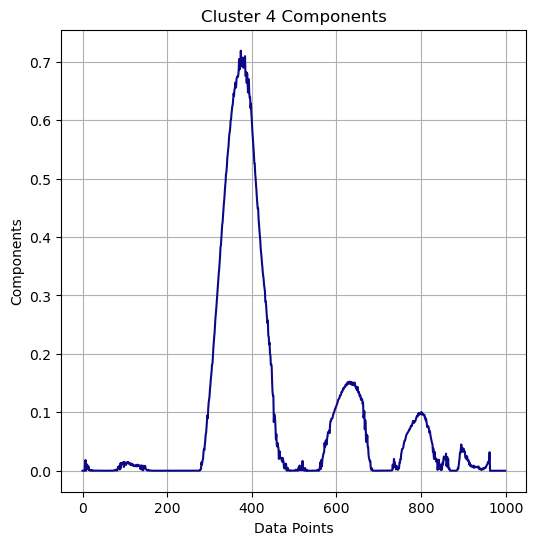

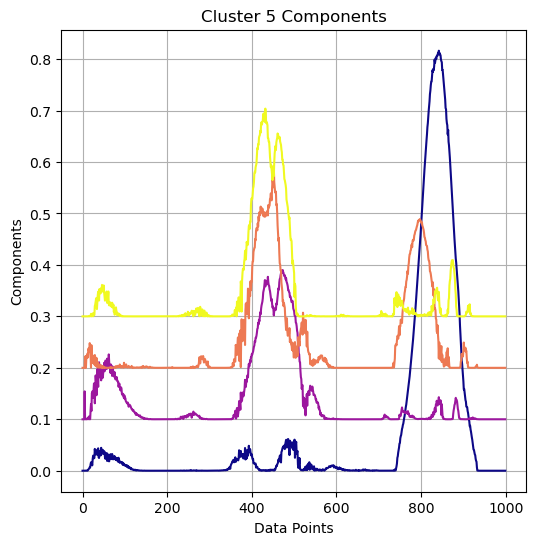

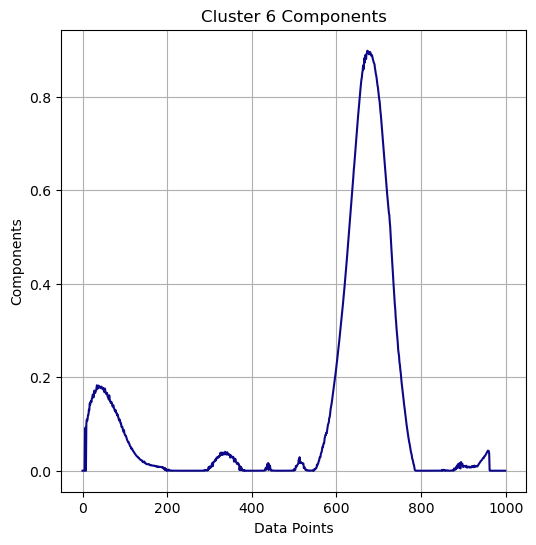

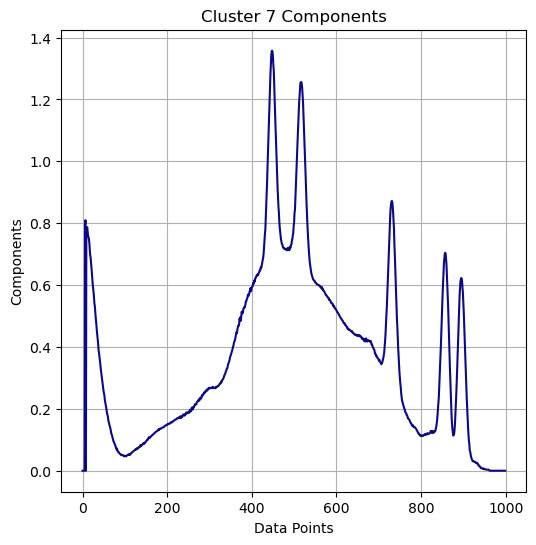

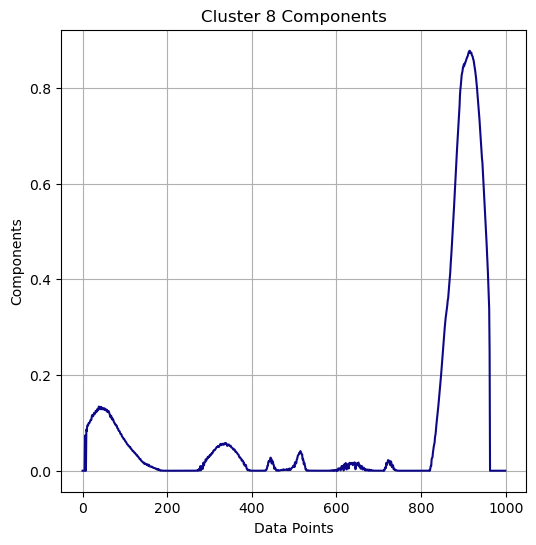

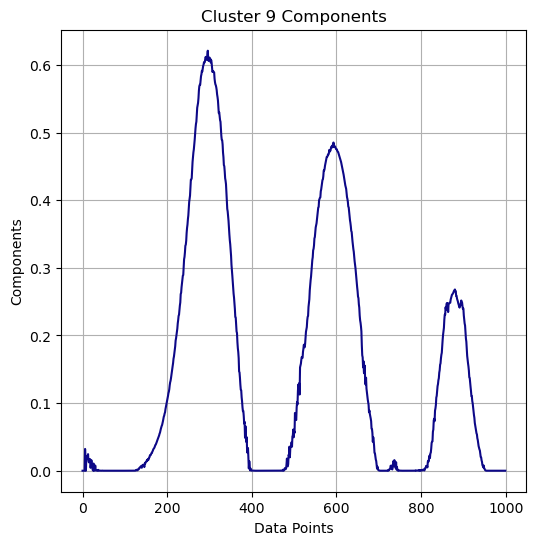

In [99]:
best_W, best_H, best_reconstruction_err, data_dict =  iso.run_sklearn_nmf_and_agg_cluster(combined_rot_data_two, max_components = 40, max_iter = 1000, n_clusters = 10, cluster_matrix = 'H')

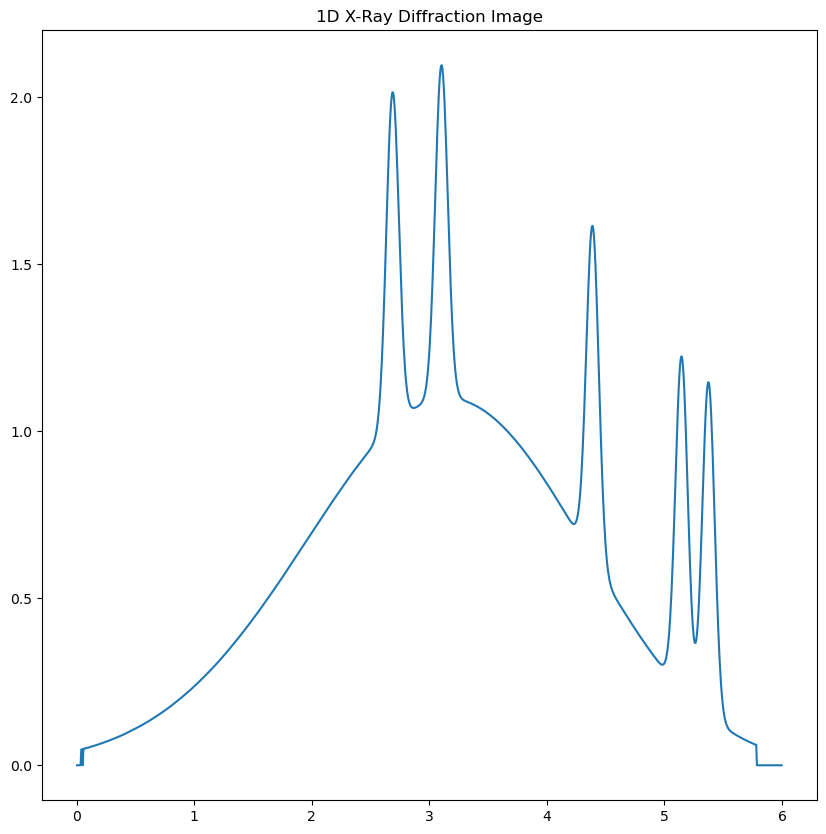

In [110]:
q, ground_truth_int = sim.integrate_image((only_int_circle), 0.4, 0.5e-10, resolution = 1000, show = True, mask= mask_one, radial_range = (0, 6))

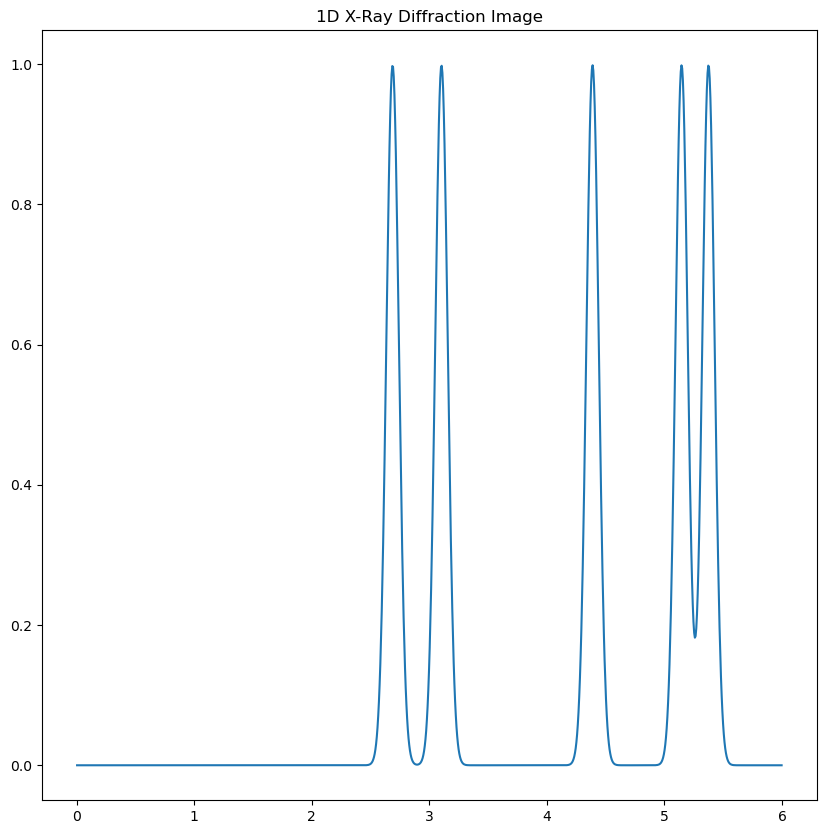

In [111]:
q, ground_truth_bragg = sim.integrate_image((only_bragg_circle), 0.4, 0.5e-10, resolution = 1000, show = True, mask= mask_one, radial_range = (0, 6))

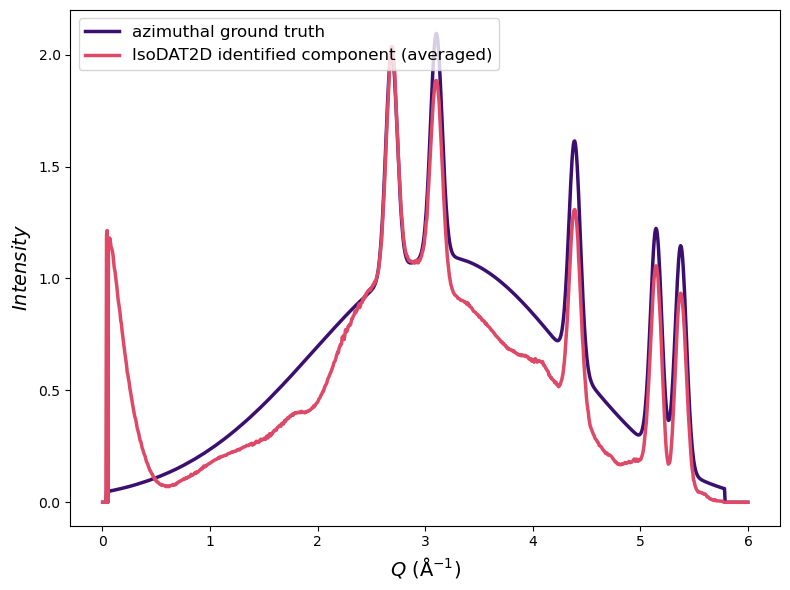

In [112]:

one = data_dict[8][0]
two = data_dict[7][0]

import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Get colors from the magma colormap
magma = cm.get_cmap('magma')
dark_color = magma(0.2)  # darker for ground truth
light_color = magma(0.6)  # lighter for IsoDAT2D component
lighter = magma(0.7)  # even lighter for IsoDAT2D component
lightest = magma(0.9)  # lightest for IsoDAT2D component

# Create the plot
plt.figure(figsize=(8, 6))


plt.plot(q, ground_truth_int, label = 'azimuthal ground truth', c = dark_color, linewidth = 2.5)
#plt.plot(q, one, label = 'Reconstructed Intensity')
plt.plot(q, two*1.5, label = 'IsoDAT2D identified component (averaged)', c= light_color, linewidth = 2.5)
#plt.plot(q, (one+two), label = 'Raw Intensity')

plt.legend()

plt.xlabel(r'$\it{Q}$ (Å$^{-1}$)', fontsize=14)
plt.ylabel(r'$\it{Intensity}$', fontsize=14)

# Make ticks nicer
plt.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()

plt.legend(fontsize=12, loc='upper left')

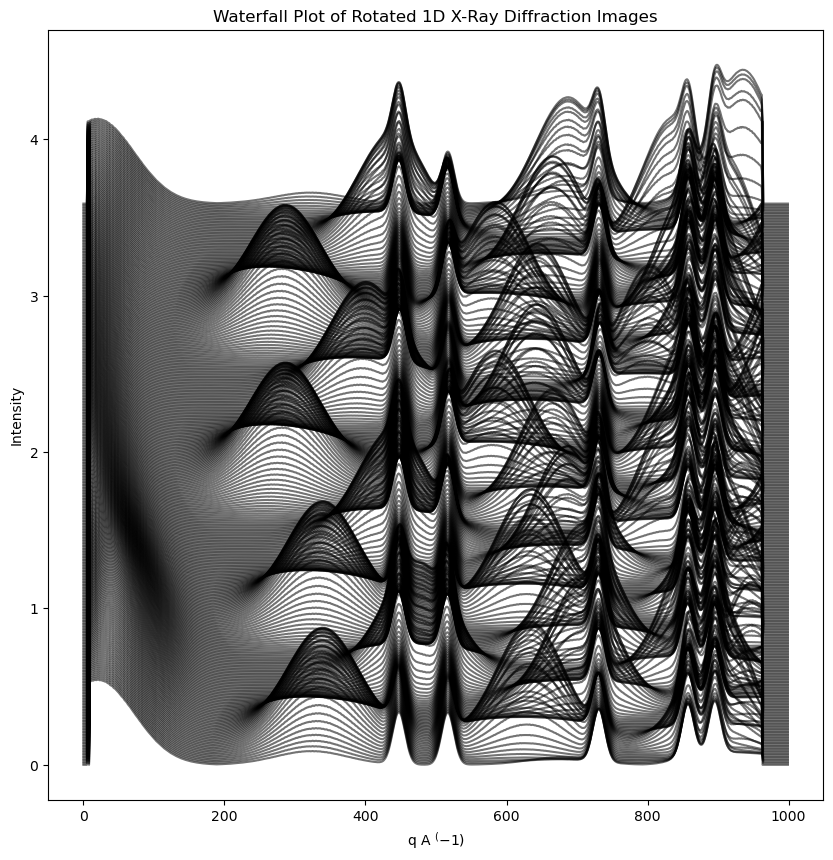

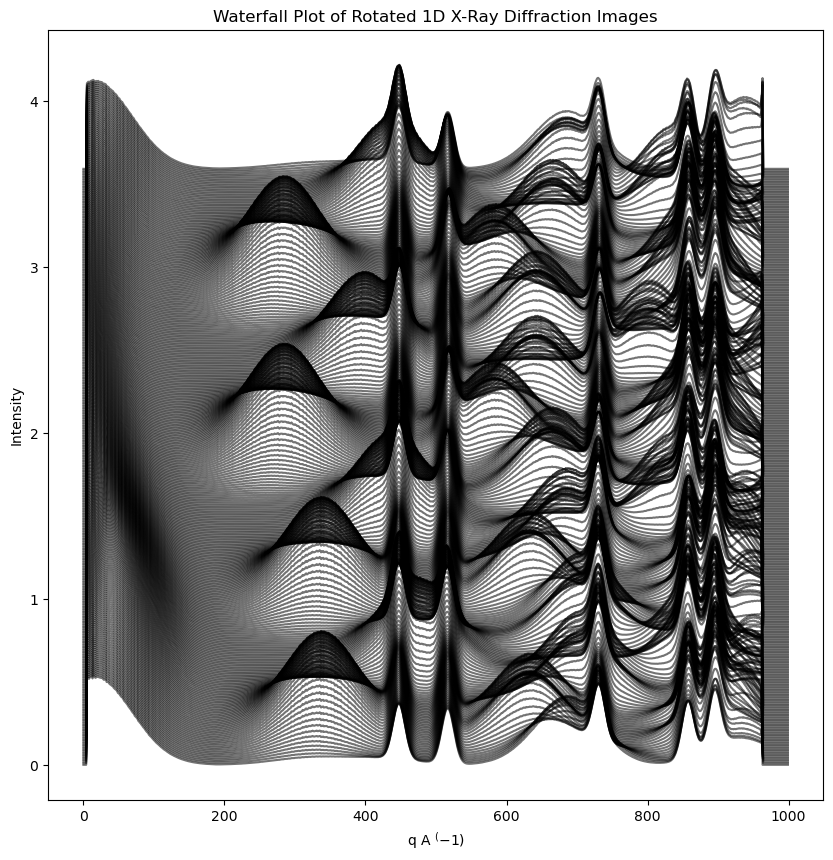

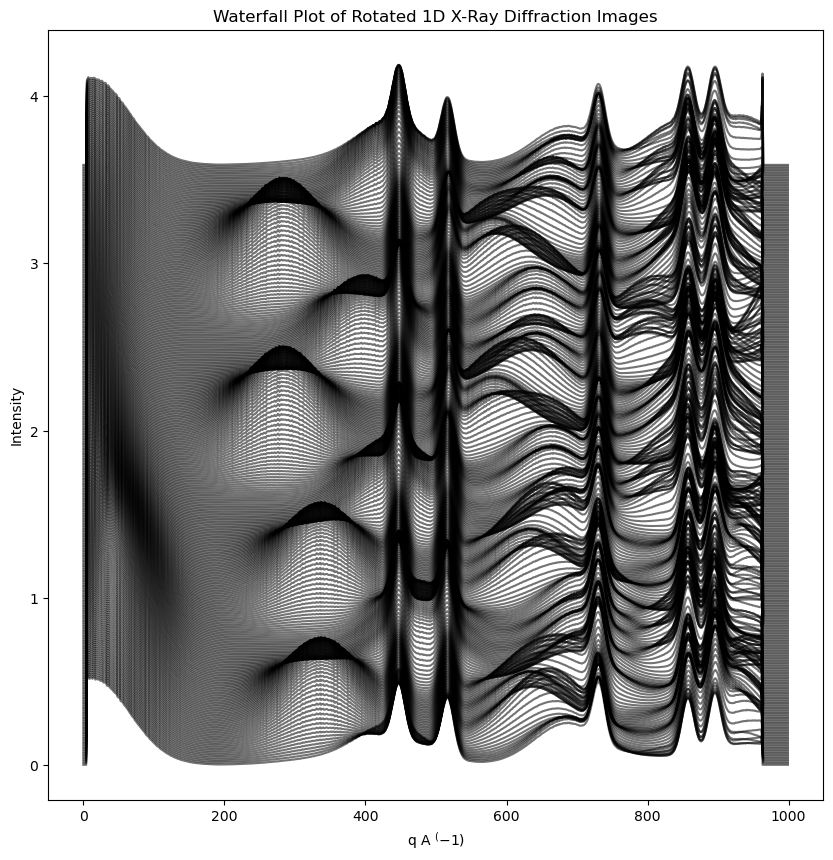

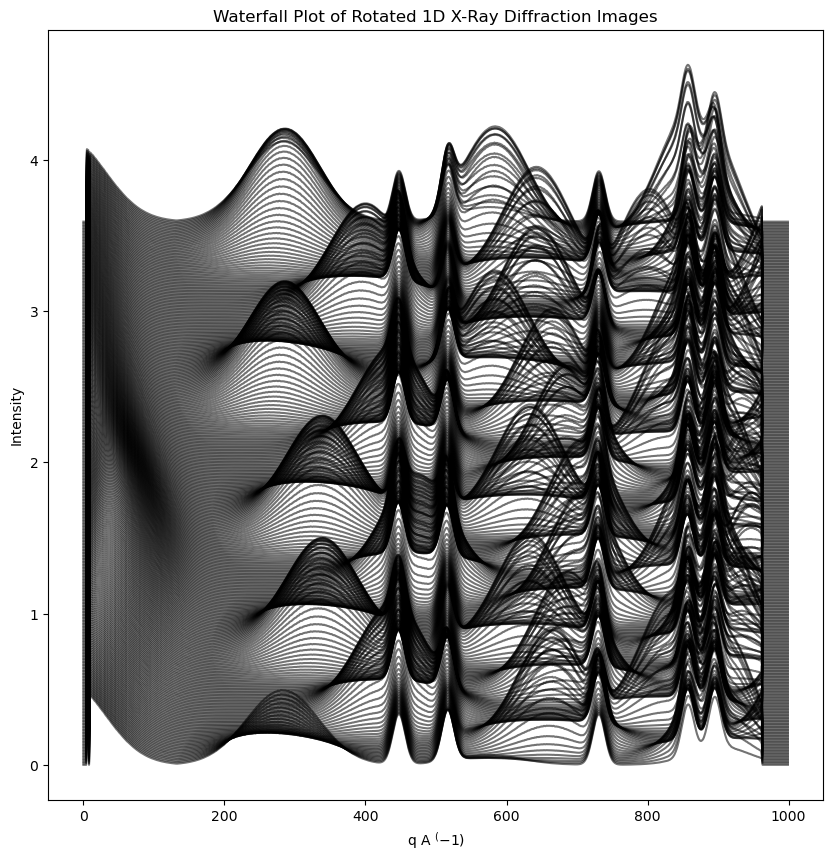

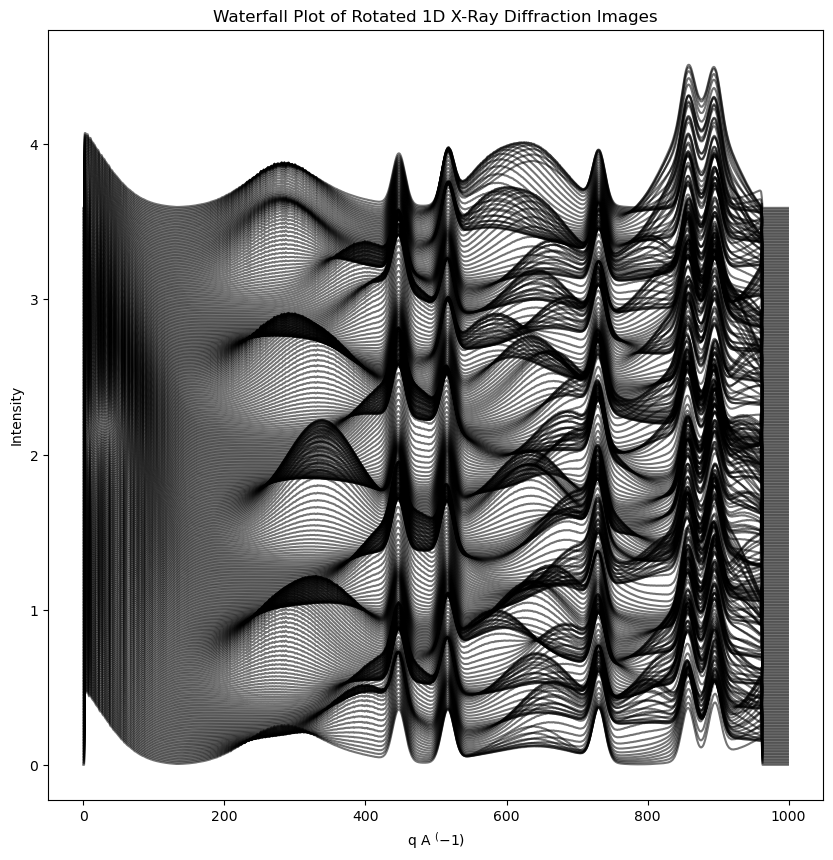

In [93]:
three_rotated_data_one = iso.rotate_integrate_image_gpu(bragg_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_one, radial_range = (0, 6))
three_rotated_data_two = iso.rotate_integrate_image_gpu(bragg_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_two, radial_range = (0, 6))
three_rotated_data_three = iso.rotate_integrate_image_gpu(bragg_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_three, radial_range = (0, 6))
three_rotated_data_four = iso.rotate_integrate_image_gpu(bragg_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_four, radial_range = (0, 6))
three_rotated_data_five = iso.rotate_integrate_image_gpu(bragg_circle, 1, .4, .5e-10, resolution = 1000, mask = mask_five, radial_range = (0, 6))

In [113]:
column_mapping = {}
for i in range(361, 721):
    column_mapping[(i - 361)] = (i)
three_rotated_data_two.rename(columns=column_mapping, inplace=True) 
   
column_mapping = {}
for i in range(722, 1082):
    column_mapping[(i - 722)] = (i)
print(column_mapping)
three_rotated_data_three.rename(columns=column_mapping, inplace=True)

column_mapping = {}
for i in range(1083, 1443):
    column_mapping[(i - 1083)] = (i)
print(column_mapping)
three_rotated_data_four.rename(columns=column_mapping, inplace=True)  
  
column_mapping = {}
for i in range(1444, 1804):
    column_mapping[(i - 1444)] = (i)
three_rotated_data_five.rename(columns=column_mapping, inplace=True)

combining_three = pd.concat([three_rotated_data_one, three_rotated_data_two, three_rotated_data_three, three_rotated_data_four, three_rotated_data_five], axis = 1)
combined_rot_data_three = combining_three.clip(lower=0)
combined_rot_data_three = np.array(combined_rot_data_three)

{0: 722, 1: 723, 2: 724, 3: 725, 4: 726, 5: 727, 6: 728, 7: 729, 8: 730, 9: 731, 10: 732, 11: 733, 12: 734, 13: 735, 14: 736, 15: 737, 16: 738, 17: 739, 18: 740, 19: 741, 20: 742, 21: 743, 22: 744, 23: 745, 24: 746, 25: 747, 26: 748, 27: 749, 28: 750, 29: 751, 30: 752, 31: 753, 32: 754, 33: 755, 34: 756, 35: 757, 36: 758, 37: 759, 38: 760, 39: 761, 40: 762, 41: 763, 42: 764, 43: 765, 44: 766, 45: 767, 46: 768, 47: 769, 48: 770, 49: 771, 50: 772, 51: 773, 52: 774, 53: 775, 54: 776, 55: 777, 56: 778, 57: 779, 58: 780, 59: 781, 60: 782, 61: 783, 62: 784, 63: 785, 64: 786, 65: 787, 66: 788, 67: 789, 68: 790, 69: 791, 70: 792, 71: 793, 72: 794, 73: 795, 74: 796, 75: 797, 76: 798, 77: 799, 78: 800, 79: 801, 80: 802, 81: 803, 82: 804, 83: 805, 84: 806, 85: 807, 86: 808, 87: 809, 88: 810, 89: 811, 90: 812, 91: 813, 92: 814, 93: 815, 94: 816, 95: 817, 96: 818, 97: 819, 98: 820, 99: 821, 100: 822, 101: 823, 102: 824, 103: 825, 104: 826, 105: 827, 106: 828, 107: 829, 108: 830, 109: 831, 110: 832,

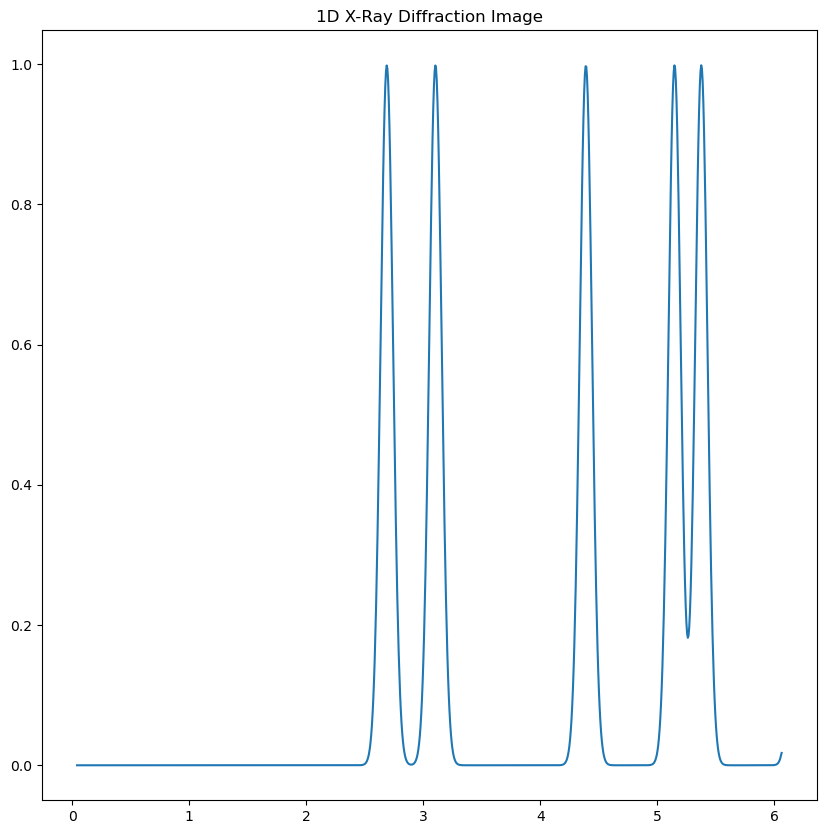

In [96]:
q, intermediate_two = sim.integrate_image(isotropic_signal, 0.4, .5e-10, resolution = 1000, mask = mask_one, show = True)

Starting NMF algorithm with the following parameters:

Max components: 40
Max iterations: 1000
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvda, solver: cd, tol: 1e-06
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed
Run with 10 components has been completed
Run with 11 components has been completed
Run with 12 components has been completed
Run with 13 components has been completed
Run with 14 components has been completed
Run with 15 components has been completed
Run with 16 components has been completed
Run with 17 components has been completed
Run with 18 components has

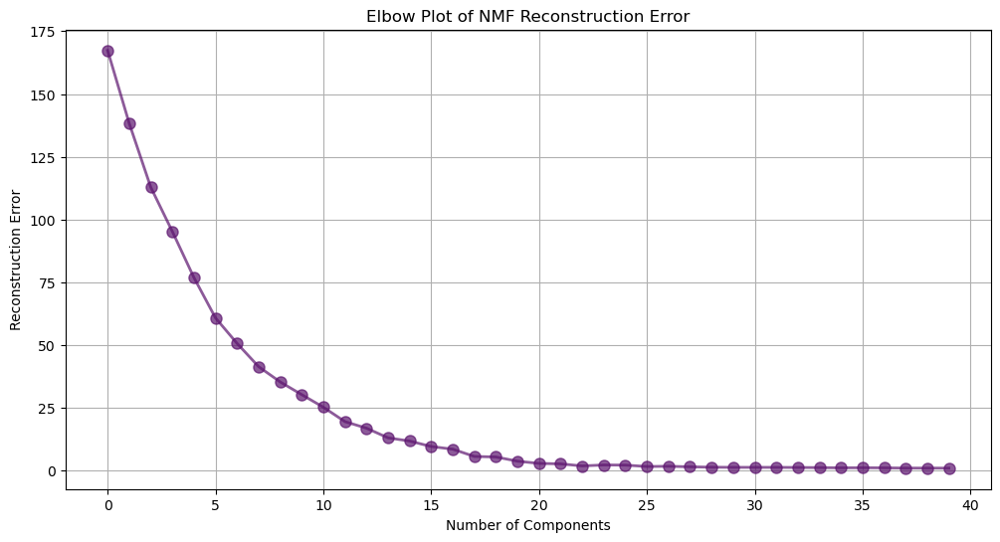

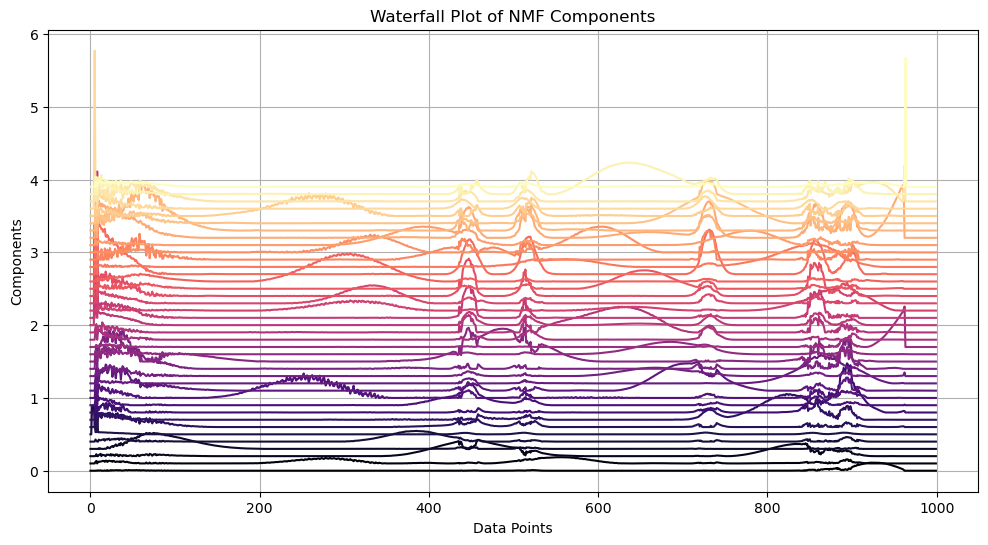

The best number of components is 40


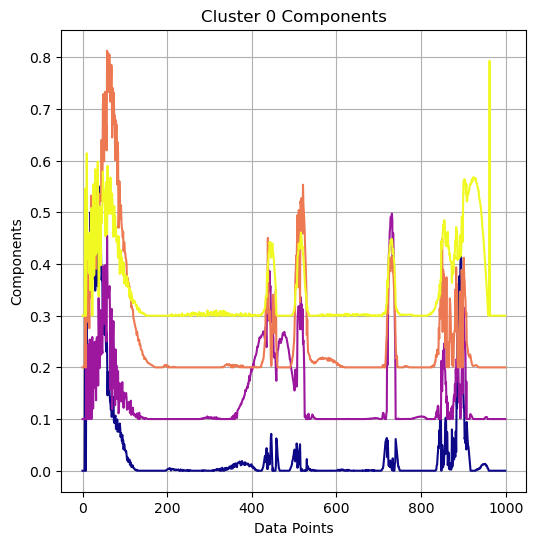

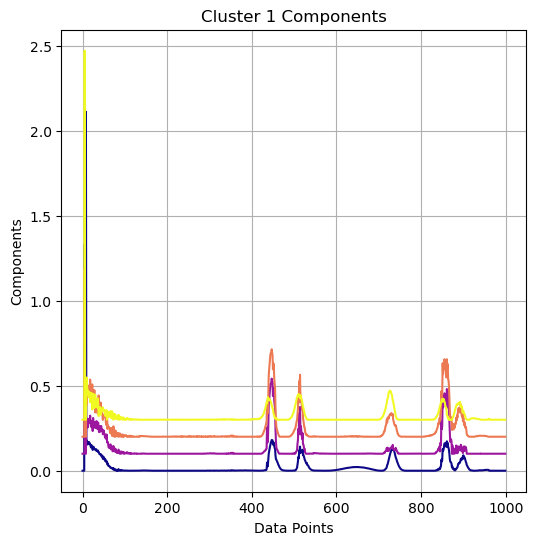

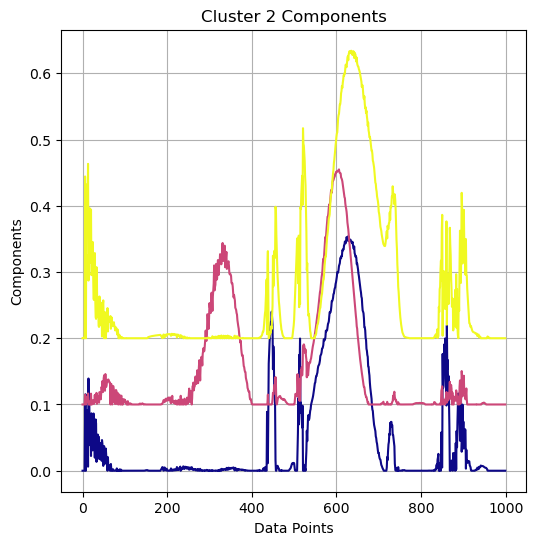

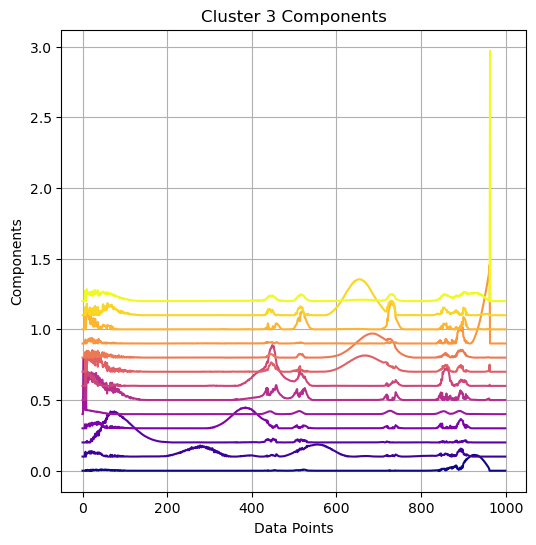

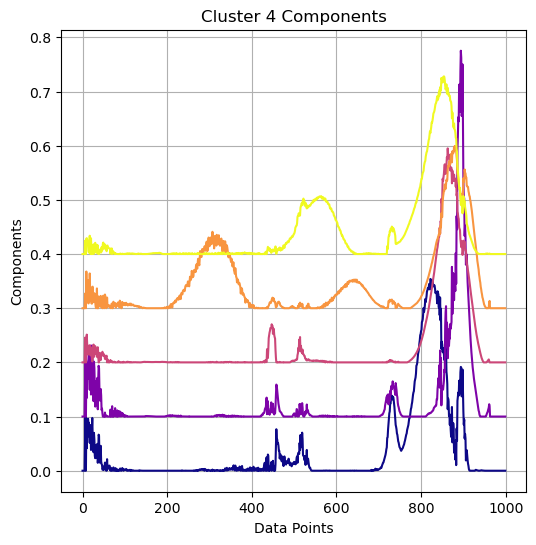

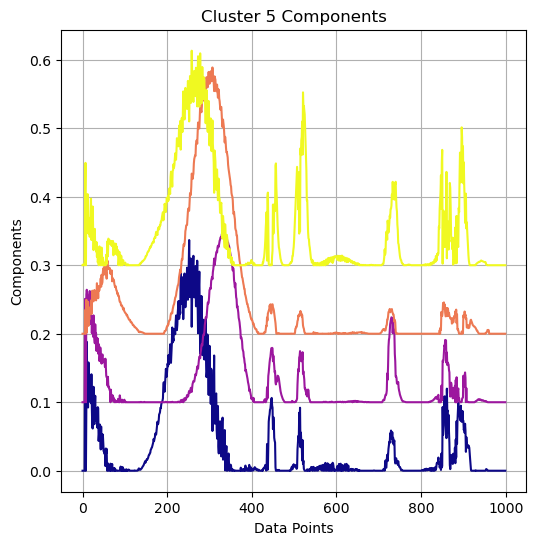

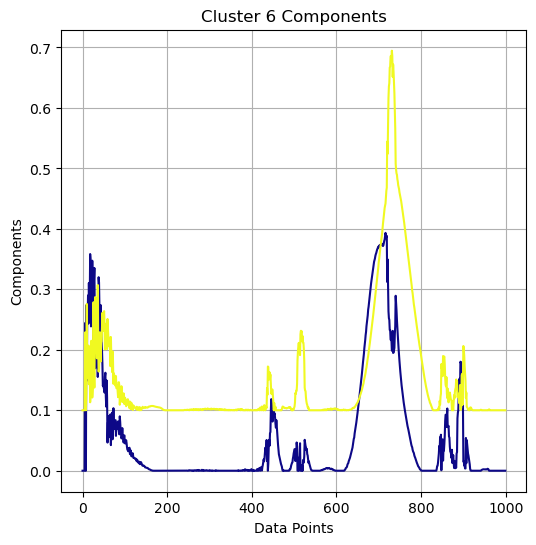

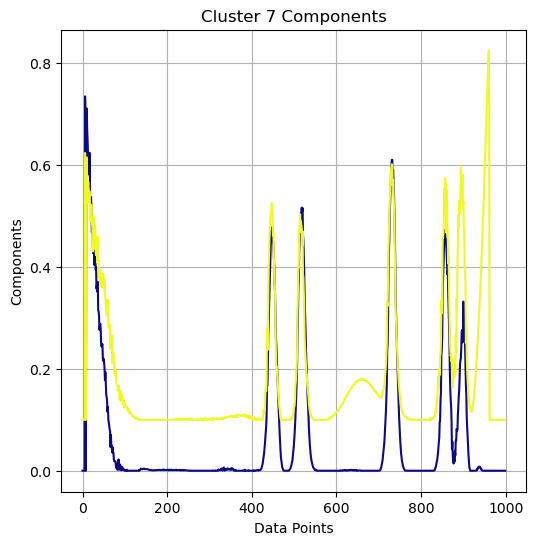

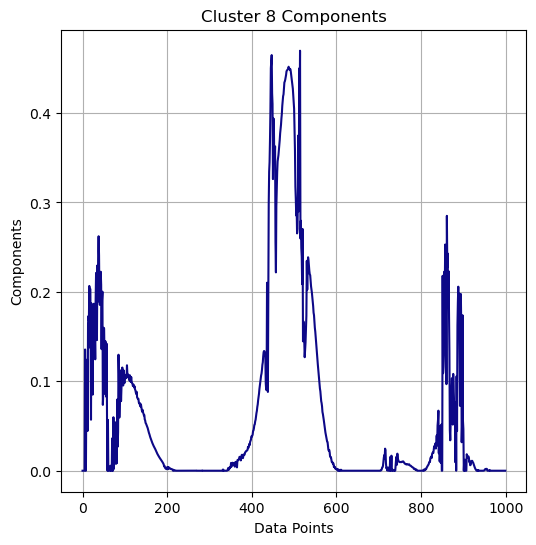

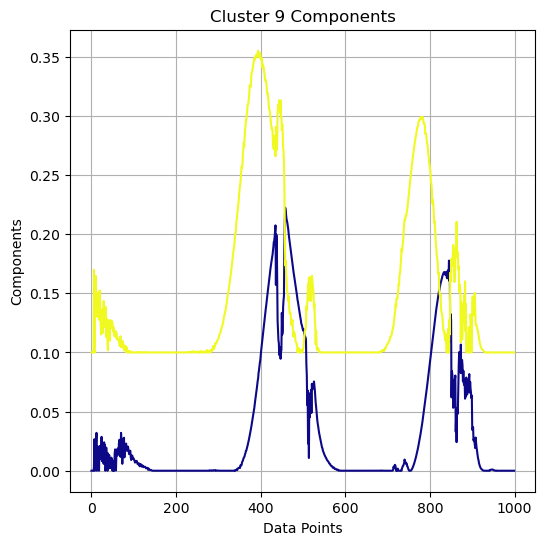

In [121]:
best_W, best_H, best_reconstruction_err, data_dict =  iso.run_sklearn_nmf_and_agg_cluster(combined_rot_data_three, max_components = 40, max_iter = 1000, n_clusters = 10, cluster_matrix = 'W')

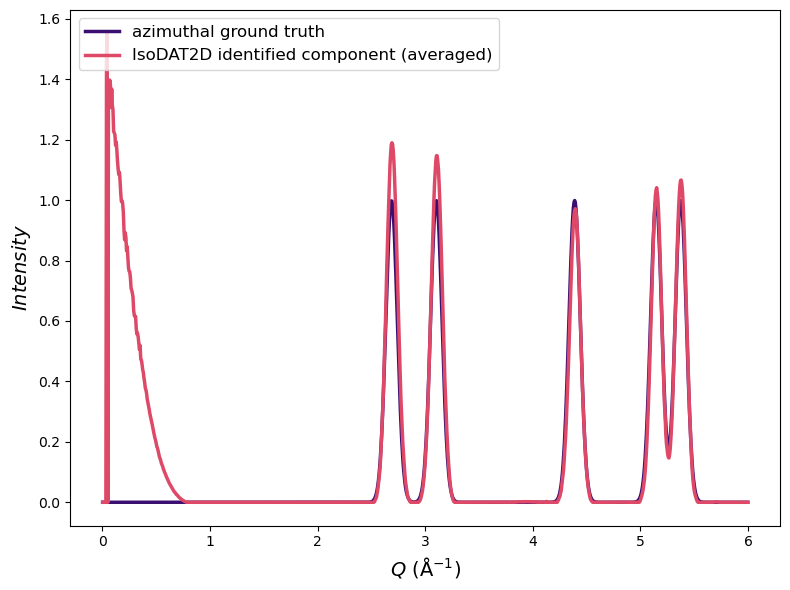

In [120]:

one = data_dict[0][0]
two = data_dict[9][0]

import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Get colors from the magma colormap
magma = cm.get_cmap('magma')
dark_color = magma(0.2)  # darker for ground truth
light_color = magma(0.6)  # lighter for IsoDAT2D component
lighter = magma(0.7)  # even lighter for IsoDAT2D component
lightest = magma(0.9)  # lightest for IsoDAT2D component

# Create the plot
plt.figure(figsize=(8, 6))


plt.plot(q, ground_truth_bragg, label = 'azimuthal ground truth', c = dark_color, linewidth = 2.5)
#plt.plot(q, one, label = 'Reconstructed Intensity')
plt.plot(q, two*3+one, label = 'IsoDAT2D identified component (averaged)', c= light_color, linewidth = 2.5)
#plt.plot(q, (one+two), label = 'Raw Intensity')

plt.legend()

plt.xlabel(r'$\it{Q}$ (Å$^{-1}$)', fontsize=14)
plt.ylabel(r'$\it{Intensity}$', fontsize=14)

# Make ticks nicer
plt.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()

plt.legend(fontsize=12, loc='upper left')